# INTELIGENCIA ARTIFICIAL - ELP 8012 - UNIVERSIDAD DEL NORTE
PROGRAMA DE INGENIERÍA DE SISTEMAS <br>
PROFESOR: EDUARDO ZUREK, PH.D.<br>
Valor: La evaluación 2 vale 25% de la nota definitiva<br>
<b>INTEGRANTES</b>:
<br>
<ul>
<li>Johan Sebastian Burgos Guerrero</li>
<li>Sebastian David Ariza Coll</li>
<li>Daniel Valencia Cordero</li>
</ul>
<hr>
Temas: Árboles de Decisión (entropía, impureza, Random Forest, Tree Bagging), Clasificadores Bayesianos Ingenuos (Naïve Bayes Classifiers)


# Lectura de documentos CSV
Se realizo la lectura y concatenacion de los dos datasets con la libreria pandas, la union de estos dos datasets se importo como csv y se utilizo para crear la variable data que contiene todo nuestro conjunto de datos a utilizar.

In [ ]:
import pandas as pd
from sklearn import tree #For our Decision Tree
from sklearn import metrics #For our Decision Tree
from sklearn.model_selection import train_test_split#split in data
import numpy as np
import graphviz 
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score
# csv_file_list = ["winequality-red.csv", "winequality-white.csv"]
# list_of_dataframes = []
# for filename in csv_file_list:
#     list_of_dataframes.append(pd.read_csv(filename))
# merged_df = pd.concat(list_of_dataframes)
# merged_df.to_csv("combined_wine_csv.csv")
np.random.seed(1456)# semilla aleatoria
#data = pd.read_csv('combined_wine_csv.csv', sep=';')
url = 'https://raw.githubusercontent.com/johansbg/DataSetIA/main/combined_wine_csv.csv'
data = pd.read_csv(url,sep=';')
data.head(5)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.08,11.0,34.0,1.0,3.51,0.56,9.4,5.0
1,7.8,0.88,0.00,2.6,0.10,25.0,67.0,1.0,3.20,0.68,9.8,5.0
2,7.8,0.76,0.04,2.3,0.09,15.0,54.0,1.0,3.26,0.65,9.8,5.0
3,11.2,0.28,0.56,1.9,0.08,17.0,60.0,1.0,3.16,0.58,9.8,6.0
4,7.4,0.70,0.00,1.9,0.08,11.0,34.0,1.0,3.51,0.56,9.4,5.0


# VERIFICACION DE DATOS NULOS

In [ ]:
data.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

# Seleccion de las variables para nuestro conjunto X
Se escogen las 11 primeras variables ya que la variable 12 es considerada nuestro fy, se crea un nuevo dataset X que contiene el conjunto de las 11 primeras variables.

In [ ]:
X = data.iloc[:, 0:11]
X[:10]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.70,0.00,1.9,0.08,11.0,34.0,1.00,3.51,0.56,9.4
1,7.8,0.88,0.00,2.6,0.10,25.0,67.0,1.00,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.09,15.0,54.0,1.00,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.08,17.0,60.0,1.00,3.16,0.58,9.8
4,7.4,0.70,0.00,1.9,0.08,11.0,34.0,1.00,3.51,0.56,9.4
5,7.4,0.66,0.00,1.8,0.08,13.0,40.0,1.00,3.51,0.56,9.4
6,7.9,0.60,0.06,1.6,0.07,15.0,59.0,1.00,3.30,0.46,9.4
7,7.3,0.65,0.00,1.2,0.07,15.0,21.0,0.99,3.39,0.47,10.0
8,7.8,0.58,0.02,2.0,0.07,9.0,18.0,1.00,3.36,0.57,9.5
9,7.5,0.50,0.36,6.1,0.07,17.0,102.0,1.00,3.35,0.80,10.5


# Se entrena el modelo
Se entrena el modelo con un estado aletorio de 1 a 10 y un tamaño indicado de teste del 30% del dataset

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(X, data['quality'], test_size=0.3, random_state=int(np.random.randint(low=1, high=10, size=1)))

# Punto 1. Árboles de decisión basados en entropía (Shannon). 
Diseñe e implemente en Python:



# Dos árboles de decisión, cada uno con un nivel diferente de profundidad.


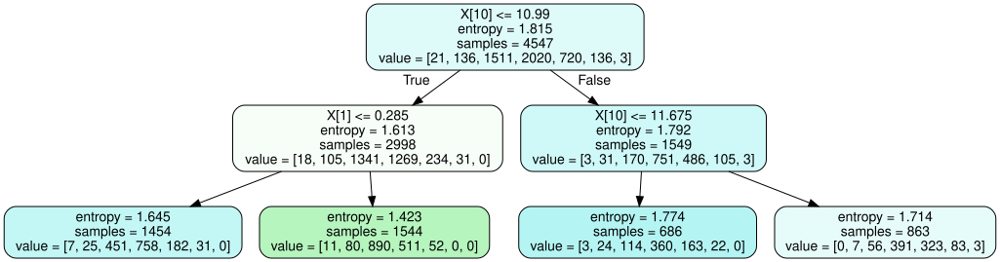

In [ ]:
# The decision tree classifier.
clf = tree.DecisionTreeClassifier(
    criterion= "entropy",
    splitter= "best",
    max_depth=2,
    #min_samples_split= 10,
    #min_samples_leaf=10,
    min_weight_fraction_leaf=0.0,
    max_features=None,
    random_state=None,
    max_leaf_nodes=None,
    #min_impurity_decrease=0.05,
    class_weight=None,
    ccp_alpha = 0.0)
clf = clf.fit(x_train, y_train)

#tree.plot_tree(clf)
# esta es la función básica de sklearn para imprimir el grafo resultante

# la que viene a continuación es la versión de graphviz
dot_data = tree.export_graphviz(clf, out_file=None,
                                filled=True,rounded=True) 
graph = graphviz.Source(dot_data)
graph

In [ ]:
y_predict = clf.predict(x_test)
CM = confusion_matrix(y_test, y_predict)
#[TP,FP;FN,TN]
print(CM)
score = clf.score(x_test, y_test)
print(score)

[[  0   0   2   7   0   0   0]
 [  0   0  37  43   0   0   0]
 [  0   0 376 251   0   0   0]
 [  0   0 222 594   0   0   0]
 [  0   0  23 336   0   0   0]
 [  0   0   2  55   0   0   0]
 [  0   0   0   2   0   0   0]]
0.49743589743589745


In [ ]:
# The decision tree classifier.
clf = tree.DecisionTreeClassifier(
    criterion= "entropy",
    splitter= "best",
    max_depth=30,
    #min_samples_split= 10,
    #min_samples_leaf=10,
    min_weight_fraction_leaf=0.0,
    max_features=None,
    random_state=None,
    max_leaf_nodes=None,
    #min_impurity_decrease=0.05,
    class_weight=None,
    ccp_alpha = 0.0)
clf = clf.fit(x_train, y_train)

#tree.plot_tree(clf)
# esta es la función básica de sklearn para imprimir el grafo resultante

# la que viene a continuación es la versión de graphviz
dot_data = tree.export_graphviz(clf, out_file=None,
                                filled=True,rounded=True) 
graph = graphviz.Source(dot_data)
graph

In [ ]:
y_predict = clf.predict(x_test)
CM = confusion_matrix(y_test, y_predict)
#[TP,FP;FN,TN]
print(CM)
score = clf.score(x_test, y_test)
print(score)

[[  0   1   3   0   3   2   0]
 [  4  17  22  29   6   2   0]
 [  7  23 415 153  25   4   0]
 [  2  16 184 505  98  11   0]
 [  2   1  29 118 190  19   0]
 [  0   0   3  17  16  21   0]
 [  0   0   1   0   1   0   0]]
0.5887179487179487


# Conclusiones

Basados en las precisiones calculadas con base en el número de profundidad en los árboles generados, podemos observar que a mayor número de profundidad, dicha presición será mucho mejor, en este caso el sistema logra clasificar el 57% de los datos de manera correcta, el cual es 6% mejor que tener un arbol con poca profundidad.

#Dos árboles de decisión (diferentes a los anteriores), sin limitar la profundidad, pero cada uno con diferentes números de nodos hoja.

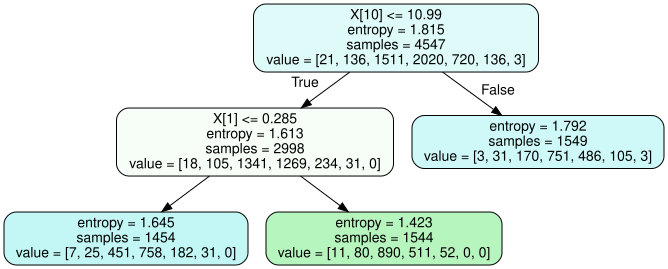

In [ ]:
# The decision tree classifier.
clf = tree.DecisionTreeClassifier(
    criterion= "entropy",
    splitter= "best",
    # max_depth=3,
    #min_samples_split= 10,
    #min_samples_leaf=10,
    min_weight_fraction_leaf=0.0,
    max_features=None,
    random_state=None,
    max_leaf_nodes=3,
    #min_impurity_decrease=0.05,
    class_weight=None,
    ccp_alpha = 0.0)
clf = clf.fit(x_train, y_train)

#tree.plot_tree(clf)
# esta es la función básica de sklearn para imprimir el grafo resultante

# la que viene a continuación es la versión de graphviz
dot_data = tree.export_graphviz(clf, out_file=None,
                                filled=True,rounded=True) 
graph = graphviz.Source(dot_data)
graph

In [ ]:
y_predict = clf.predict(x_test)
CM = confusion_matrix(y_test, y_predict)
#[TP,FP;FN,TN]
print(CM)
score = clf.score(x_test, y_test)
print(score)

[[  0   0   2   7   0   0   0]
 [  0   0  37  43   0   0   0]
 [  0   0 376 251   0   0   0]
 [  0   0 222 594   0   0   0]
 [  0   0  23 336   0   0   0]
 [  0   0   2  55   0   0   0]
 [  0   0   0   2   0   0   0]]
0.49743589743589745


In [ ]:
# The decision tree classifier.
clf = tree.DecisionTreeClassifier(
    criterion= "entropy",
    splitter= "best",
    # max_depth=3,
    #min_samples_split= 10,
    #min_samples_leaf=10,
    min_weight_fraction_leaf=0.0,
    max_features=None,
    random_state=None,
    max_leaf_nodes=1000,
    #min_impurity_decrease=0.05,
    class_weight=None,
    ccp_alpha = 0.0)
clf = clf.fit(x_train, y_train)


# la que viene a continuación es la versión de graphviz
dot_data = tree.export_graphviz(clf, out_file=None,
                                filled=True,rounded=True) 
graph = graphviz.Source(dot_data)
graph

In [ ]:
y_predict = clf.predict(x_test)
CM = confusion_matrix(y_test, y_predict)
#[TP,FP;FN,TN]
print(CM)
score = clf.score(x_test, y_test)
print(score)

[[  0   0   3   1   3   2   0]
 [  2  15  24  30   7   2   0]
 [  7  25 412 164  15   4   0]
 [  2  17 199 479 109  10   0]
 [  2   1  29 125 182  20   0]
 [  0   2   4  16  17  18   0]
 [  0   0   1   1   0   0   0]]
0.5671794871794872


# Conclusiones

Con base en los dos árboles generados y las pruebas realizadas, podemos asegurar que un al generar árboles con un mayor número de hojas es más probable tener una mejor precisición en estos, no obstante esto no asegura que al tener un número muy grande en cantidad de hojas haga que dicha precisión aumente.

# Dos árboles de decisión (diferentes a los anteriores), sin limitar la profundidad, pero cada uno con diferentes umbrales de ganancia al generar los nodos hijos.


In [ ]:
# The decision tree classifier.
clf = tree.DecisionTreeClassifier(
    criterion= "entropy",
    splitter= "best",
    max_depth=None,
    #min_samples_split= 10,
    #min_samples_leaf=10,
    min_weight_fraction_leaf=0.0,
    max_features=None,
    random_state=None,
    max_leaf_nodes=None,
    min_impurity_decrease=0.0001,
    class_weight=None,
    ccp_alpha = 0.0)
clf = clf.fit(x_train, y_train)

#tree.plot_tree(clf)
# esta es la función básica de sklearn para imprimir el grafo resultante

# la que viene a continuación es la versión de graphviz
dot_data = tree.export_graphviz(clf, out_file=None,
                                filled=True,rounded=True) 
graph = graphviz.Source(dot_data)
graph

In [ ]:
y_predict = clf.predict(x_test)
CM = confusion_matrix(y_test, y_predict)
#[TP,FP;FN,TN]
print(CM)
score = clf.score(x_test, y_test)
print(score)

[[  0   1   2   0   4   2   0]
 [  2  12  32  24   8   2   0]
 [  3  23 416 158  24   3   0]
 [  1  16 178 497 110  14   0]
 [  2   3  29 111 195  18   1]
 [  0   0   3  16  17  21   0]
 [  0   0   1   0   1   0   0]]
0.5851282051282052


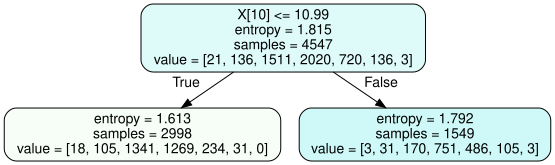

In [ ]:
# The decision tree classifier.
clf = tree.DecisionTreeClassifier(
    criterion= "entropy",
    splitter= "best",
    max_depth=None,
    #min_samples_split= 10,
    #min_samples_leaf=10,
    min_weight_fraction_leaf=0.0,
    max_features=None,
    random_state=None,
    max_leaf_nodes=None,
    min_impurity_decrease=0.09,
    class_weight=None,
    ccp_alpha = 0.0)
clf = clf.fit(x_train, y_train)


# la que viene a continuación es la versión de graphviz
dot_data = tree.export_graphviz(clf, out_file=None,
                                filled=True,rounded=True) 
graph = graphviz.Source(dot_data)
graph

In [ ]:
y_predict = clf.predict(x_test)
CM = confusion_matrix(y_test, y_predict)
#[TP,FP;FN,TN]
print(CM)
score = clf.score(x_test, y_test)
print(score)

[[  0   0   3   6   0   0   0]
 [  0   0  60  20   0   0   0]
 [  0   0 565  62   0   0   0]
 [  0   0 526 290   0   0   0]
 [  0   0 125 234   0   0   0]
 [  0   0  11  46   0   0   0]
 [  0   0   1   1   0   0   0]]
0.43846153846153846


# Conclusiones

Al basarnos en diferentes umbrales de ganancia, si consideramos generar árboles con un menor umbral de ganancia se tendrá así más profundidad en los mismos, por tanto es más probable que la precisión aumente.  

#Dos árboles de decisión (diferentes a los anteriores), sin limitar la profundidad, pero podados con diferentes márgenes de confianza en la clasificación de los datos.

In [ ]:
# The decision tree classifier.
clf = tree.DecisionTreeClassifier(
    criterion= "entropy",
    splitter= "best",
    max_depth=None,
    #min_samples_split= 10,
    #min_samples_leaf=10,
    min_weight_fraction_leaf=0.0,
    max_features=None,
    random_state=None,
    max_leaf_nodes=None,
    #min_impurity_decrease=0.5,
    class_weight=None,
    ccp_alpha = 0.0)
clf = clf.fit(x_train, y_train)


# la que viene a continuación es la versión de graphviz
dot_data = tree.export_graphviz(clf, out_file=None,
                                filled=True,rounded=True) 
graph = graphviz.Source(dot_data)
graph

In [ ]:
y_predict = clf.predict(x_test)
CM = confusion_matrix(y_test, y_predict)
#[TP,FP;FN,TN]
print(CM)
score = clf.score(x_test, y_test)
print(score)

[[  0   0   4   1   3   1   0]
 [  1  17  25  28   6   3   0]
 [  4  24 419 154  22   4   0]
 [  3  18 189 491 104  11   0]
 [  1   1  28 118 191  20   0]
 [  0   0   4  16  17  20   0]
 [  0   0   1   0   1   0   0]]
0.5835897435897436


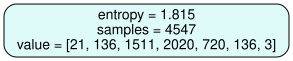

In [ ]:
# The decision tree classifier.
clf = tree.DecisionTreeClassifier(
    criterion= "entropy",
    splitter= "best",
    max_depth=None,
    #min_samples_split= 10,
    #min_samples_leaf=10,
    min_weight_fraction_leaf=0.0,
    max_features=None,
    random_state=None,
    max_leaf_nodes=None,
    #min_impurity_decrease=0.5,
    class_weight=None,
    ccp_alpha = 0.2)
clf = clf.fit(x_train, y_train)


# la que viene a continuación es la versión de graphviz
dot_data = tree.export_graphviz(clf, out_file=None,
                                filled=True,rounded=True) 
graph = graphviz.Source(dot_data)
graph

In [ ]:
y_predict = clf.predict(x_test)
CM = confusion_matrix(y_test, y_predict)
#[TP,FP;FN,TN]
print(CM)
score = clf.score(x_test, y_test)
print(score)

[[  0   0   0   9   0   0   0]
 [  0   0   0  80   0   0   0]
 [  0   0   0 627   0   0   0]
 [  0   0   0 816   0   0   0]
 [  0   0   0 359   0   0   0]
 [  0   0   0  57   0   0   0]
 [  0   0   0   2   0   0   0]]
0.41846153846153844


# Conclusiones
Podemos observar que al generar árboles de clasificación con un margen de confianza mucho menor, la precisión en estos aumenta conforme dicho margen disminuya.

*texto en cursiva*# Punto 2. Random Forest.
Diseñe e implemente en Python sistemas de clasificación basados en Random Forest:




# Dos sistemas diferentes fijando el número de características que usados para la clasificación, pero variando el número de árboles.

In [ ]:
clf = RandomForestClassifier(
          n_estimators =100, #cantidad de árboles
          #integer, optional (default=100)
          criterion="gini",
          #string, optional (default=”gini”)
          max_depth=None,
          #integer or None, optional (default=None)
          min_samples_split=2,
          #int, float, optional (default=2)
          min_samples_leaf=1,
          #int, float, optional (default=1)
          min_weight_fraction_leaf=0.0,
          #float, optional (default=0.)
          max_features="auto",# caracteristicas
          #int, float, string or None, optional (default=”auto”)
          max_leaf_nodes=None,
          #int or None, optional (default=None)
          min_impurity_decrease=0.0,
          #float, optional (default=0.)
          bootstrap=True,
          #boolean, optional (default=True)
          oob_score=False,
          #bool (default=False)
          n_jobs=None,
          #int or None, optional (default=None)
          random_state=None,
          #int, RandomState instance or None, optional (default=None)
          verbose=0,
          #int, optional (default=0)
          warm_start=False,
          #bool, optional (default=False)
          ccp_alpha=0.0,
          #non-negative float, optional (default=0.0)
          max_samples=None
          #int or float, default=None
          )

clf.fit(x_train, y_train)
y_predict = clf.predict(x_test)
CM = confusion_matrix(y_test, y_predict)
#[TP,FP;FN,TN]
print(CM)
score = clf.score(x_test, y_test)
print(score)


[[  0   0   4   5   0   0   0]
 [  0  10  33  37   0   0   0]
 [  0   3 446 176   2   0   0]
 [  0   2 150 626  38   0   0]
 [  0   0   8 181 169   1   0]
 [  0   0   0  26  13  18   0]
 [  0   0   0   1   1   0   0]]
0.6507692307692308


In [ ]:
clf = RandomForestClassifier(
          n_estimators =10000, #cantidad de árboles
          #integer, optional (default=100)
          criterion="gini",
          #string, optional (default=”gini”)
          max_depth=None,
          #integer or None, optional (default=None)
          min_samples_split=2,
          #int, float, optional (default=2)
          min_samples_leaf=1,
          #int, float, optional (default=1)
          min_weight_fraction_leaf=0.0,
          #float, optional (default=0.)
          max_features="auto",# caracteristicas
          #int, float, string or None, optional (default=”auto”)
          max_leaf_nodes=None,
          #int or None, optional (default=None)
          min_impurity_decrease=0.0,
          #float, optional (default=0.)
          bootstrap=True,
          #boolean, optional (default=True)
          oob_score=False,
          #bool (default=False)
          n_jobs=None,
          #int or None, optional (default=None)
          random_state=None,
          #int, RandomState instance or None, optional (default=None)
          verbose=0,
          #int, optional (default=0)
          warm_start=False,
          #bool, optional (default=False)
          ccp_alpha=0.0,
          #non-negative float, optional (default=0.0)
          max_samples=None
          #int or float, default=None
          )

clf.fit(x_train, y_train)
y_predict = clf.predict(x_test)
CM = confusion_matrix(y_test, y_predict)
#[TP,FP;FN,TN]
print(CM)
score = clf.score(x_test, y_test)
print(score)

[[  0   0   3   6   0   0   0]
 [  0  11  32  37   0   0   0]
 [  0   2 458 165   2   0   0]
 [  0   3 142 636  35   0   0]
 [  0   0   6 174 178   1   0]
 [  0   0   0  28  11  18   0]
 [  0   0   0   2   0   0   0]]
0.6671794871794872


# Conclusiones
Podemos observar que entre mayor número de árboles, la precisión será mucho mejor.

#Dos sistemas diferentes fijando el número de árboles, pero cambiando el número de características usado para la clasificación.

In [ ]:
clf = RandomForestClassifier(
          n_estimators =100, #cantidad de árboles
          #integer, optional (default=100)
          criterion="gini",
          #string, optional (default=”gini”)
          max_depth=None,
          #integer or None, optional (default=None)
          min_samples_split=2,
          #int, float, optional (default=2)
          min_samples_leaf=1,
          #int, float, optional (default=1)
          min_weight_fraction_leaf=0.0,
          #float, optional (default=0.)
          max_features=0.01,# caracteristicas
          #int, float, string or None, optional (default=”auto”)
          max_leaf_nodes=None,
          #int or None, optional (default=None)
          min_impurity_decrease=0.0,
          #float, optional (default=0.)
          bootstrap=True,
          #boolean, optional (default=True)
          oob_score=False,
          #bool (default=False)
          n_jobs=None,
          #int or None, optional (default=None)
          random_state=None,
          #int, RandomState instance or None, optional (default=None)
          verbose=0,
          #int, optional (default=0)
          warm_start=False,
          #bool, optional (default=False)
          ccp_alpha=0.0,
          #non-negative float, optional (default=0.0)
          max_samples=None
          #int or float, default=None
          )

clf.fit(x_train, y_train)
y_predict = clf.predict(x_test)
CM = confusion_matrix(y_test, y_predict)
#[TP,FP;FN,TN]
print(CM)
score = clf.score(x_test, y_test)
print(score)

[[  0   0   4   5   0   0   0]
 [  0  11  31  38   0   0   0]
 [  0   2 453 171   1   0   0]
 [  0   3 138 643  32   0   0]
 [  0   0   8 195 155   1   0]
 [  0   0   0  26  13  18   0]
 [  0   0   0   2   0   0   0]]
0.6564102564102564


In [ ]:
clf = RandomForestClassifier(
          n_estimators =100, #cantidad de árboles
          #integer, optional (default=100)
          criterion="gini",
          #string, optional (default=”gini”)
          max_depth=None,
          #integer or None, optional (default=None)
          min_samples_split=2,
          #int, float, optional (default=2)
          min_samples_leaf=1,
          #int, float, optional (default=1)
          min_weight_fraction_leaf=0.0,
          #float, optional (default=0.)
          max_features=10,# caracteristicas
          #int, float, string or None, optional (default=”auto”)
          max_leaf_nodes=None,
          #int or None, optional (default=None)
          min_impurity_decrease=0.0,
          #float, optional (default=0.)
          bootstrap=True,
          #boolean, optional (default=True)
          oob_score=False,
          #bool (default=False)
          n_jobs=None,
          #int or None, optional (default=None)
          random_state=None,
          #int, RandomState instance or None, optional (default=None)
          verbose=0,
          #int, optional (default=0)
          warm_start=False,
          #bool, optional (default=False)
          ccp_alpha=0.0,
          #non-negative float, optional (default=0.0)
          max_samples=None
          #int or float, default=None
          )

clf.fit(x_train, y_train)
y_predict = clf.predict(x_test)
CM = confusion_matrix(y_test, y_predict)
#[TP,FP;FN,TN]
print(CM)
score = clf.score(x_test, y_test)
print(score)

[[  0   0   4   5   0   0   0]
 [  0  12  37  31   0   0   0]
 [  0   5 456 162   2   2   0]
 [  0   3 147 613  53   0   0]
 [  0   0  12 161 184   2   0]
 [  0   0   0  23  15  19   0]
 [  0   0   0   1   1   0   0]]
0.6584615384615384


# Conclusiones

Para este apartado, la precisión dependerá de las características que se tegan presentes a la hora de hacer la clasificación.

# Punto 3. Naïve Bayes Classifiers.


#Diseñe e implemente en Python un sistema de clasificación Bayesiano Ingenuo.


In [ ]:
# Create a Naive Bayes object
nbf = GaussianNB()
#Split data into training and testing data
xf_train, xf_test, yf_train, yf_test, = train_test_split(X, data['quality'], test_size=0.3, random_state=1970)
#Training the model
nbf.fit(xf_train, yf_train)
Yf_pred = nbf.predict(xf_test)
print("Accuracy NB:",accuracy_score(yf_test, Yf_pred))

Accuracy NB: 0.02923076923076923


In [ ]:
# Create a Naive Bayes object
nbf = GaussianNB()
#Split data into training and testing data
xf_train, xf_test, yf_train, yf_test, = train_test_split(X, data['quality'], test_size=0.99, random_state=1970)
#Training the model
nbf.fit(xf_train, yf_train)
Yf_pred = nbf.predict(xf_test)
print("Accuracy NB:",accuracy_score(yf_test, Yf_pred))

Accuracy NB: 0.45997201927561016


# Conclusiones

Al realizar un sistema de clasifición bayesiano ingenuo, su precisión dependerá de la cantidad de datos que este se le otorgue.